# Spatial plotting functionalities

This notebook shows the insitupy plotting functionalities. It assumes that the previous steps of the demo notebooks such as preprocessing, import of annotations and regions and cell type annotation have been run.

In [1]:
## The following code ensures that all functions and init files are reloaded before executions.
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path

import insitupy as isp
from insitupy import CACHE, InSituData

c:\Users\ge37voy\AppData\Local\miniconda3\envs\insitupy\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Load data

In [3]:
insitupy_project = Path(CACHE / "out/demo_insitupy_project")
xd = InSituData.read(insitupy_project)
xd.load_all()

In [4]:
xd

InSituData
Method:		Xenium
Slide ID:	0001879
Sample ID:	Replicate 1
Path:		C:\Users\ge37voy\.cache\InSituPy\out\demo_insitupy_project

    ➤ images
       CD20:	(25778, 35416)
       HE:	(25778, 35416, 3)
       HER2:	(25778, 35416)
       nuclei:	(25778, 35416)
    ➤ cells
       MultiCellData with main layer 'main'
           matrix
               AnnData object with n_obs × n_vars = 156447 × 297
               obs: 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'n_genes', 'leiden', 'cell_type_dc_sub_final', 'cell_type_publ'
               var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
               uns: 'cell_type_dc_sub_final_colors', 'cell_type_publ_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
               obsm: 'X_pca', 'X_umap', 'annotations', 'regions', 'spatial'
             

## Sample-level or experimental level plotting of expression data

In [5]:
#from insitupy.plotting import spatial

Using the `keys` argument, one or multiple keys can be selected to be displayed.

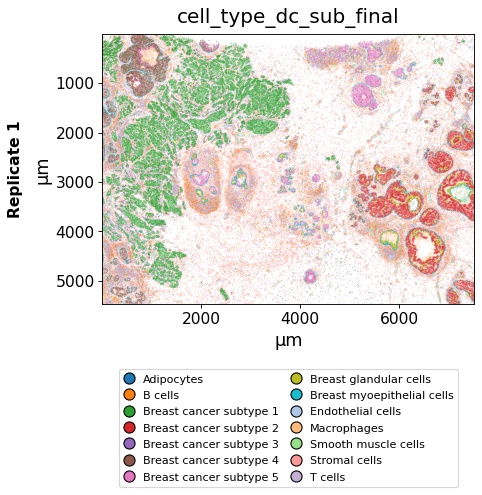

In [6]:
isp.pl.spatial(xd, keys="cell_type_dc_sub_final")

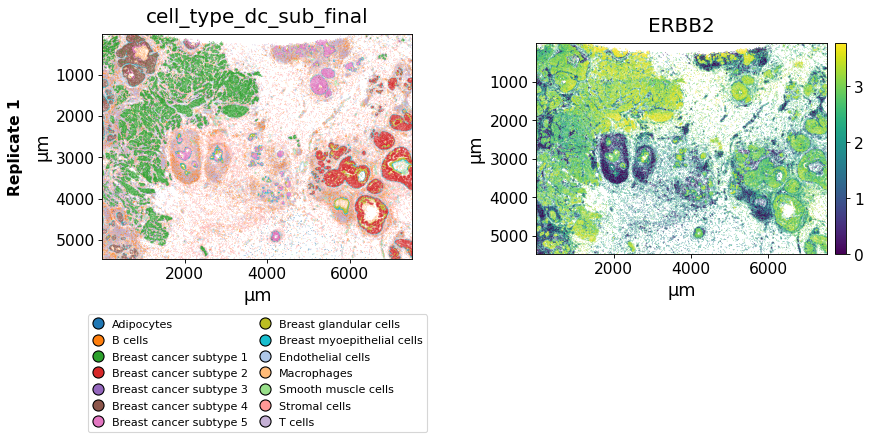

In [7]:
isp.pl.spatial(xd, keys=["cell_type_dc_sub_final", "ERBB2"])

The `savepath` argument can be used to save the plot in a certain path. The filename extension determines the format of the output image. When saving as `.pdf` long saving times can occur due to the large number of data points. 

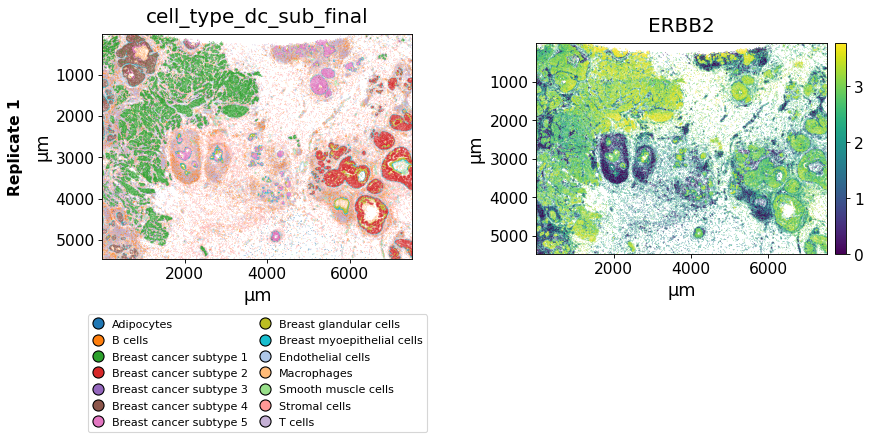

In [8]:
isp.pl.spatial(xd,
               keys=["cell_type_dc_sub_final", "ERBB2"],
               savepath="figures/spatial-demo.png"
               )

The `image_key` argument can be used to select a image to be displayed in the background.

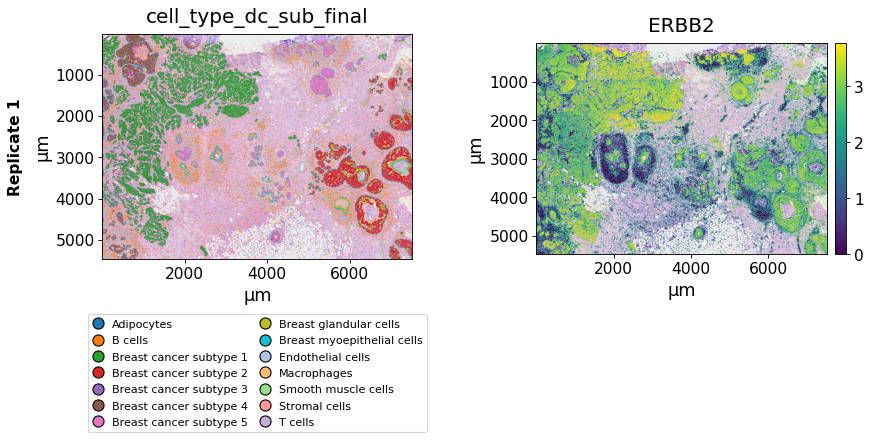

In [9]:
isp.pl.spatial(xd, keys=["cell_type_dc_sub_final", "ERBB2"],
               image_key="HE")

The `xlim`/`ylim` parameters can be used to zoom into the images and plot only selected regions and the `spot_size` argument to adapt the size of the spots. Further, the opacity of the spots can be adapted using `alpha`.

In [10]:
from insitupy.plotting.spatial import DataConfig, LayoutConfig, PlotConfig

# to further configure the plot one can use the configuration classes: PlotConfig, LayoutConfig and DataConfig
plot_config = PlotConfig(legend_max_per_col=8, show_scale=False)

# all possible configurations can be shown with `show_all()`:
plot_config.show_all()

Configuration parameters for PlotConfig:
	xlim: None
	ylim: None
	spot_size: 10
	alpha: 1.0
	cmap: viridis
	palette: <matplotlib.colors.ListedColormap object at 0x0000021227100250>
	spot_type: o
	background_color: white
	cmap_center: None
	normalize: None
	show_legend: True
	legend_max_per_col: 8
	clb_title: None
	annotations_mode: outlined
	crange: None
	crange_type: upper_percentile
	origin_zero: False
	label_size: 16
	show_title: True
	title_size: 18
	show_scale: False
	tick_label_size: 14
	pixelwidth_per_subplot: 200
	histogram_setting: auto


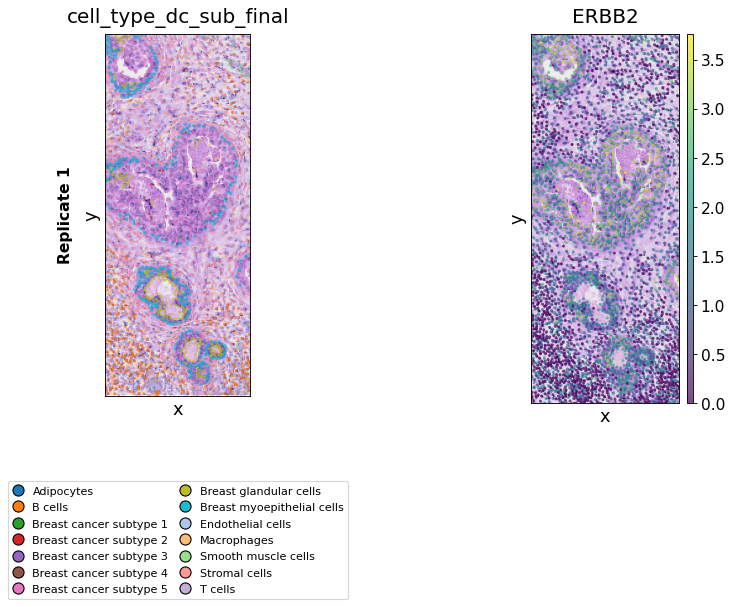

In [11]:
# a configurations file can then be used to customize the plot:
isp.pl.spatial(xd, keys=["cell_type_dc_sub_final", "ERBB2"],
             spot_size=8, alpha=0.7,
             xlim=(1800, 2200), ylim=(2500, 3500),
             image_key="HE",
             plot_config=plot_config
             )

One can also deactivate plotting of the color legend:

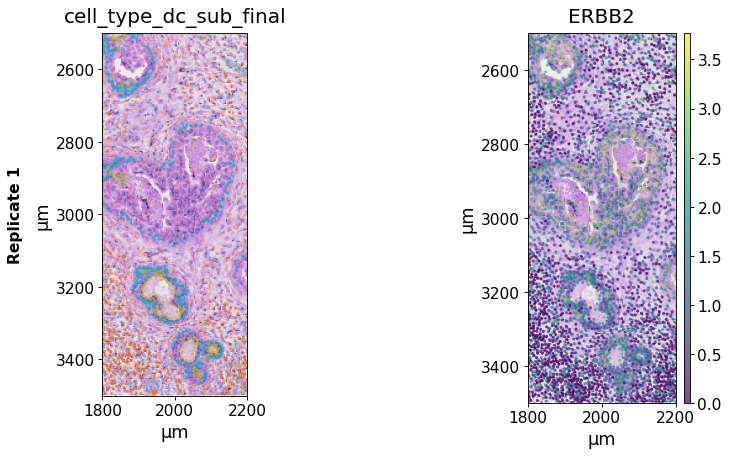

In [12]:
plot_config = PlotConfig(show_legend=False)

# a configurations file can then be used to customize the plot:
isp.pl.spatial(xd, keys=["cell_type_dc_sub_final", "ERBB2"],
             spot_size=8, alpha=0.7,
             xlim=(1800, 2200), ylim=(2500, 3500),
             image_key="HE",
             plot_config=plot_config
             )

Here is how one can plot the color legend separately:

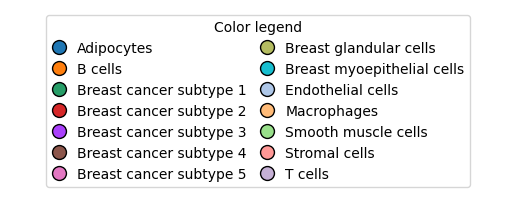

In [13]:
# extract the color mapping from the anndata object
mapping = dict(zip(xd.cells.matrix.obs['cell_type_dc_sub_final'].cat.categories,
                   xd.cells.matrix.uns['cell_type_dc_sub_final_colors']))

# plot color legend
isp.pl.colorlegend(mapping=mapping)

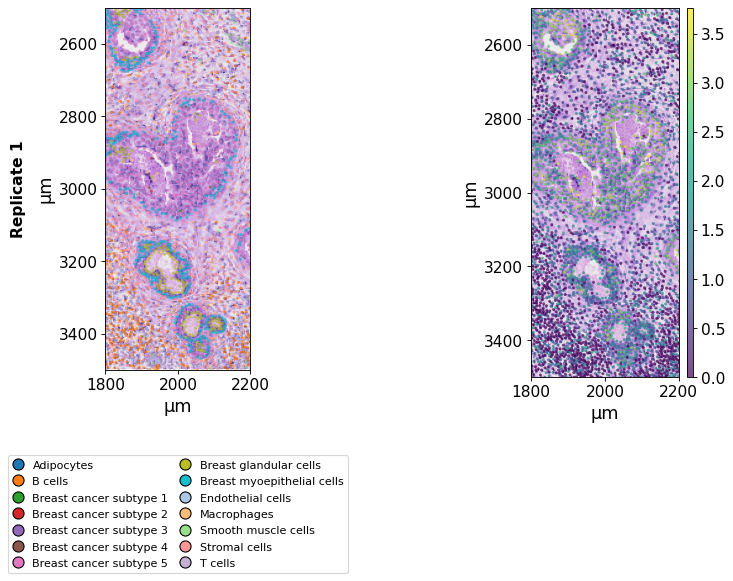

In [14]:
plot_config = PlotConfig(show_title=False)

# a configurations file can then be used to customize the plot:
isp.pl.spatial(xd, keys=["cell_type_dc_sub_final", "ERBB2"],
             spot_size=8, alpha=0.7,
             xlim=(1800, 2200), ylim=(2500, 3500),
             image_key="HE",
             plot_config=plot_config
             )

When working with an `InSituExperiment` object for multi-sample analysis, one can directly plot all datasets within the `InSituExperiment` object. For details on generating `InSituExperiment` objects and working with them see [this notebook](../03_multisample_analysis/InSituPy_InSituExperiment.ipynb).

In [15]:
from insitupy import InSituExperiment

First, we generate an `InSituExperiment` object.

In [16]:
exp = InSituExperiment.from_regions(
    data=xd, region_key="TMA"
)

And then we can use the `spatial` function directly on the `InSituExperiment` object. The `name_column` argument can be used to determine the column in the `.metadata` dataframe to be used for naming the plot.

In [17]:
exp.metadata

You are accessing a copy of the metadata. Changes to this DataFrame will not affect the internal metadata. Use `add_metadata_column()` or `append_metadata()` to add new information to the metadata.


,uid,slide_id,sample_id,region_key,region_name
0,65c8aa01,0001879,Replicate 1,TMA,A-1
1,d2f9da60,0001879,Replicate 1,TMA,A-2
2,e31d993a,0001879,Replicate 1,TMA,A-3
3,24afa4ec,0001879,Replicate 1,TMA,B-1
4,e0371e8f,0001879,Replicate 1,TMA,B-2
5,7babcda0,0001879,Replicate 1,TMA,B-3


When using both multiple datasets and multiple keys the plots are represented in a grid layout. The `wspace` and `hspace` parameters in `LayoutConfig` can be used to increase the spacing between the subplots in case they are overlapping using the default parameters. Further, the `name_column` parameter in `DataConfig` can be used to determine which column in `.metadata` of the `InSituExperiment` should be used to infer the title of the different datasets. If using the default `None`, the title is retrieved from the column `"sample_id"`.

Key 'cell_type_dc_sub_final' found already in `exp.colors`. To overwrite it, run `sync_colors` with `overwrite=True`.


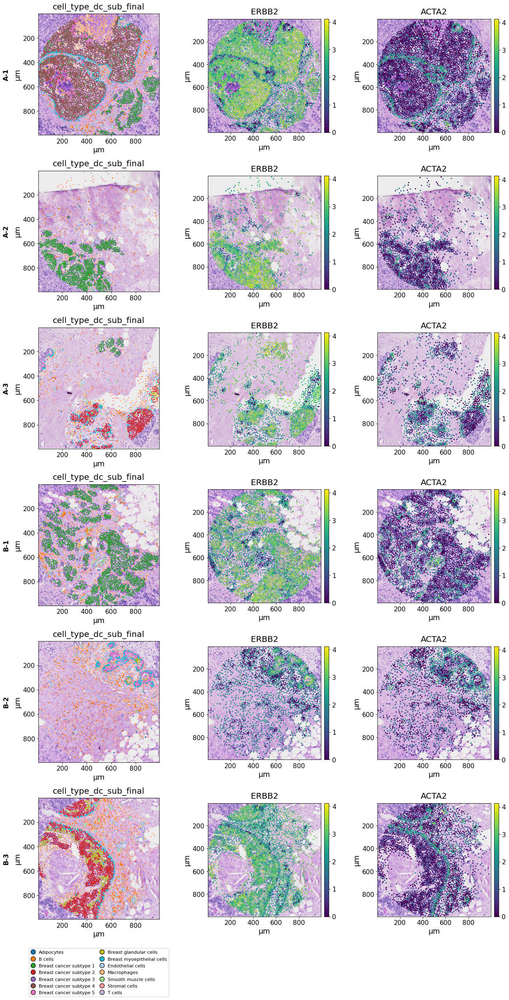

In [19]:
data_config = DataConfig(name_column="region_name")
layout_config = LayoutConfig(wspace=0.4, hspace=0.2)

isp.pl.spatial(
    exp,
    keys=["cell_type_dc_sub_final", "ERBB2", "ACTA2"], image_key="HE",
    data_config=data_config,
    layout_config=layout_config,
    savepath="figures/spatial-demo-regions.png"
    )

When using only multiple datasets but only one key, they are listed next to each other.

Key 'cell_type_dc_sub_final' found already in `exp.colors`. To overwrite it, run `sync_colors` with `overwrite=True`.


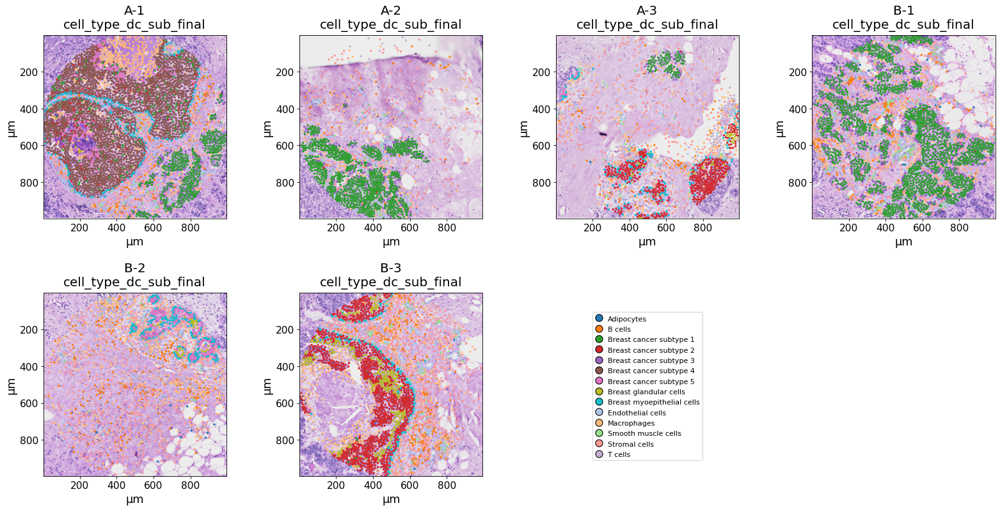

In [26]:
data_config = DataConfig(name_column="region_name")
plot_config = PlotConfig(legend_max_per_col=14)

isp.pl.spatial(exp, keys=["cell_type_dc_sub_final"],
               image_key="HE",
               data_config=data_config,
               plot_config=plot_config
               )

## Cellular composition plotting

In [27]:
from insitupy.plotting import cellular_composition

Since only one dataset is given, all regions are plotted into one figure.


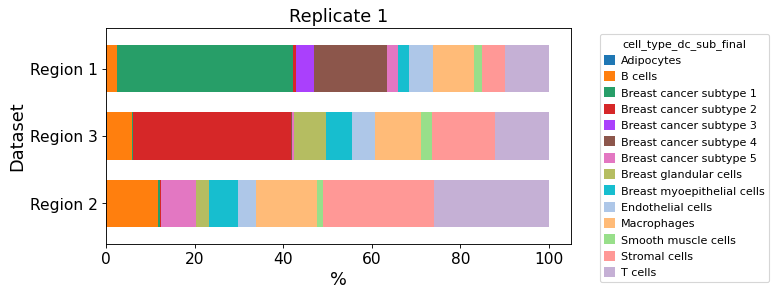

In [28]:
cellular_composition(
    data=xd, cell_type_col="cell_type_dc_sub_final",
    geom_key="Demo", modality="regions", max_cols=1,
    #savepath="figures/cell_composition_regions_Demo_publ.pdf"
)

When plotting an `InSituExperiment` object, the datasets are compared against each other.

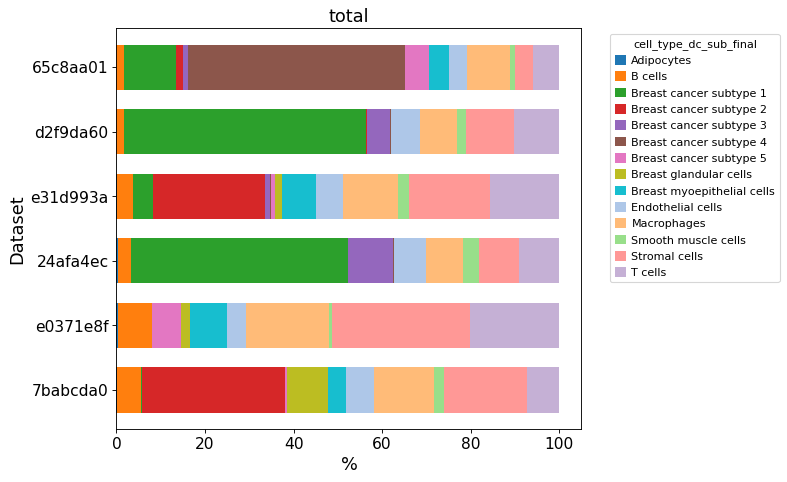

In [29]:
cellular_composition(
    data=exp, cell_type_col="cell_type_dc_sub_final",
)

If a `geom_key` together with an `InSituExperiment` object are given, the datasets are compared against each other per geometry. If a dataset does not contain one of the geometries, the bar stays empty.

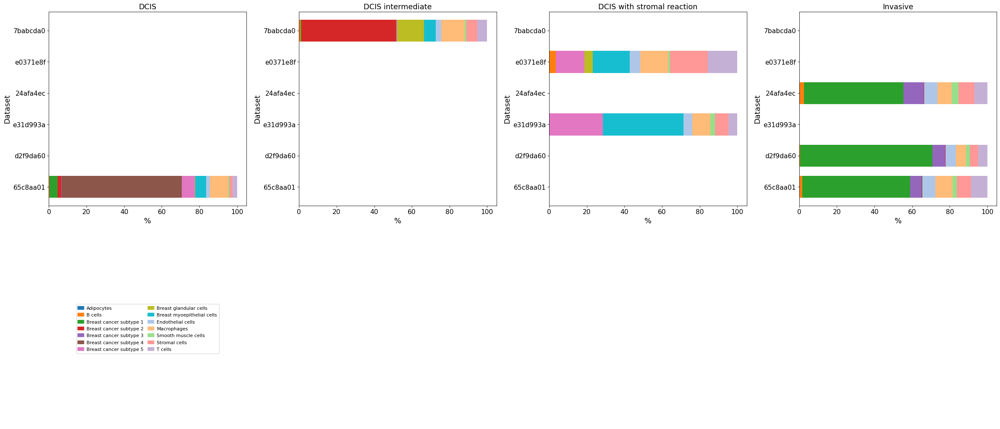

In [30]:
cellular_composition(
    data=exp, cell_type_col="cell_type_dc_sub_final",
    geom_key="Katja", modality="annotations", max_cols=4,
    legend_max_per_col=10,
    #savepath="figures/cell_composition_regions_Demo_publ.pdf"
)

Whether to use a vertical or horizontal bar plot can be specified using `plot_type`. The dimensions of the bar plots can be changed using the `aspect_factor` argument. The legend can be adapted using `legend_max_per_col`.

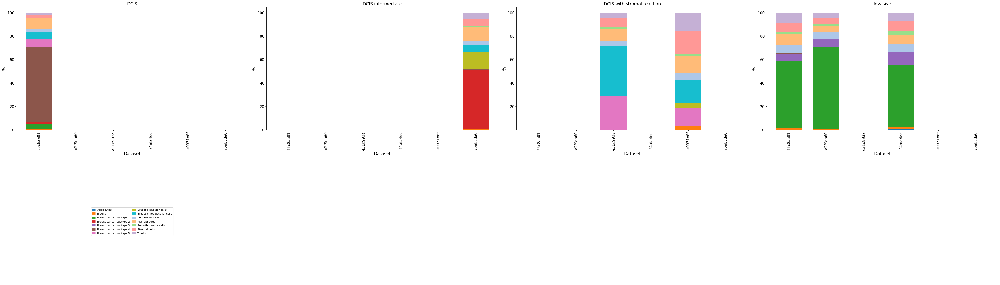

In [31]:
cellular_composition(
    data=exp, cell_type_col="cell_type_dc_sub_final",
    geom_key="Katja", modality="annotations", max_cols=4,
    plot_type="bar", aspect_factor=0.5,
    legend_max_per_col=10,
    #savepath="figures/cell_composition_regions_Demo_publ.pdf"
)